<a href="https://colab.research.google.com/github/Divya2293/CODSOFT-INTERNSHIP/blob/main/CODSOFT_Movie_Genre_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import nltk
import os


custom_download_path = '/kaggle/working/nltk_data'


os.makedirs(custom_download_path, exist_ok=True)


nltk.data.path.append(custom_download_path)


nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
import warnings


warnings.filterwarnings("ignore")

In [ ]:
train_data=pd.read_csv("/content/train_data.txt",delimiter=':::',header=None,engine='python')
test_data=pd.read_csv("/content/test_data.txt",delimiter=":::",header=None,engine='python')
test_solution=pd.read_csv("/content/test_data_solution.txt",delimiter=":::",header=None,engine='python')

In [ ]:
train_data.shape

(54214, 4)

In [ ]:
train_data.head()

,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [ ]:
test_data.shape

(54200, 3)

In [ ]:
test_data.head()

,0,1,2
0,1,Edgar's Lunch (1998),"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),Before he was known internationally as a mart...


In [ ]:
test_solution.shape

(54200, 4)

In [ ]:
test_solution.head()

,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [ ]:
data=pd.concat((train_data,test_solution))
data.columns=["MovieID","MovieName","Genre","Description"]
data.head()

,MovieID,MovieName,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [ ]:
data.shape

(108414, 4)

#Data Cleaning and Preprocessing

**Delete Duplicates**

In [ ]:
data.duplicated().sum()
data.drop_duplicates(inplace = True)

**Handle Null values**

In [ ]:
#check for NULL values
data.isnull().sum()


MovieID        0
MovieName      0
Genre          0
Description    0
dtype: int64

No NULL values present in the dataset

In [ ]:
data.shape

(108414, 4)

In [ ]:
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [ ]:

stopword = set(stopwords.words('english'))

def preprocessing(text):

    text = text.lower()


    text = re.sub(r'[^\w\s]', '', text)


    text = re.sub(r'[#@\$]', '', text)


    tokens = word_tokenize(text)


    lemmatizer  = WordNetLemmatizer()


    text = text.split()

    text = [word for word in text if word not in stopword]
    return " ".join(text)

In [ ]:
data["Despcription_clean"] =  data["Description"].apply(preprocessing)

In [ ]:
data.head()

,MovieID,MovieName,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [ ]:
data["Genre"].value_counts()

 drama           27225
 documentary     26192
 comedy          14893
 short           10145
 horror           4408
 thriller         3181
 action           2629
 western          2064
 reality-tv       1767
 family           1567
 adventure        1550
 music            1462
 romance          1344
 sci-fi           1293
 adult            1180
 crime            1010
 animation         996
 sport             863
 talk-show         782
 fantasy           645
 mystery           637
 musical           553
 biography         529
 history           486
 game-show         387
 news              362
 war               264
Name: Genre, dtype: int64

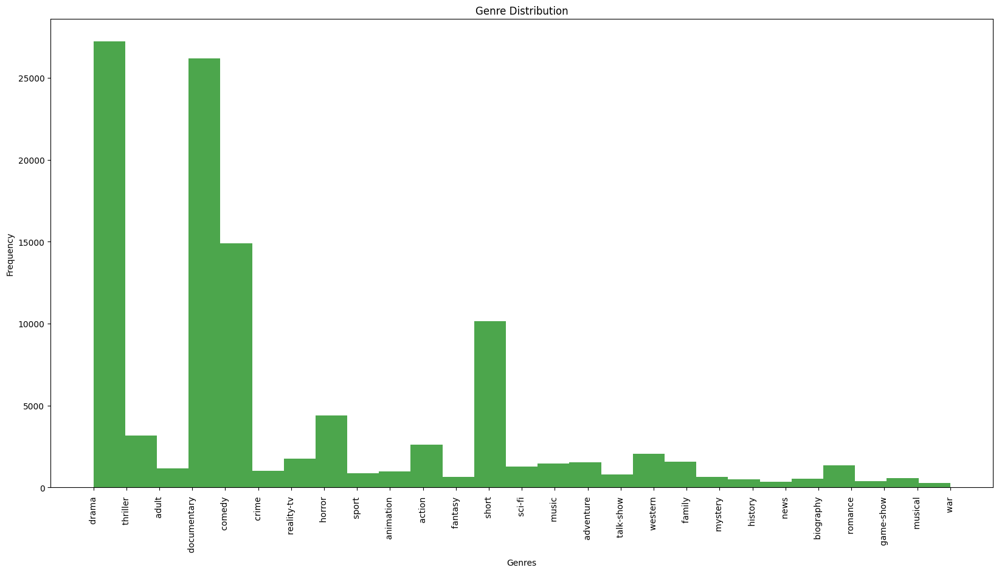

In [ ]:
plt.figure(figsize=(20, 10))
plt.hist(data["Genre"],bins =27 , color='green', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

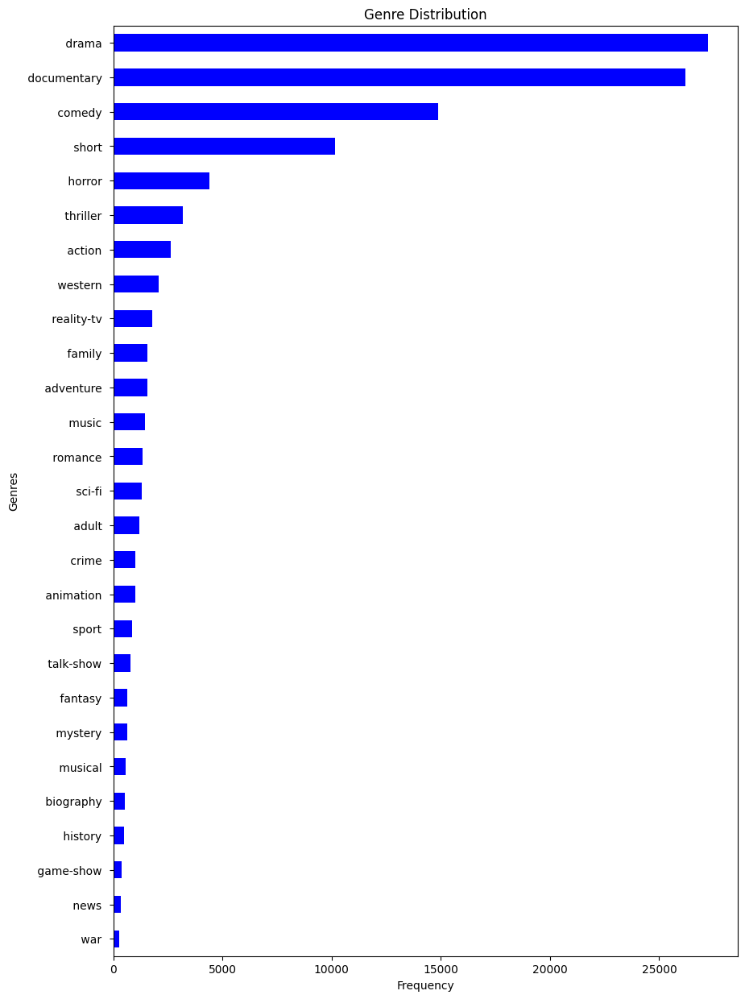

In [ ]:
genre_counts = data["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)

plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

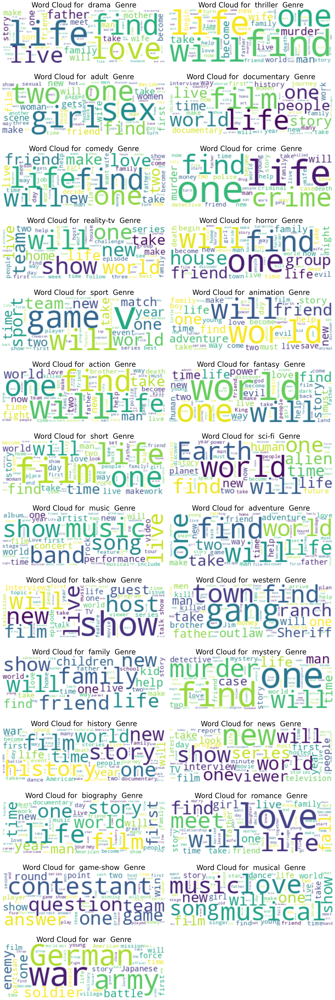

In [ ]:
t
genres = data['Genre'].unique()


plt.figure(figsize=(20, 60))


for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(data[data["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
data = data.drop(["MovieName","MovieID"] , axis = 1) # will drop column
data.head()

,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [ ]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [ ]:
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

In [ ]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

#MultinomialNaiveBayes

Model Score on Training data 0.6398620104414559
Model Score on Training data 0.5229582895198037
               precision    recall  f1-score   support

      action        0.03      0.65      0.07        72
       adult        0.02      0.71      0.04        17
   adventure        0.06      0.68      0.12        74
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         7
      comedy        0.45      0.53      0.49      6330
       crime        0.00      0.00      0.00         0
 documentary        0.89      0.57      0.69     20666
       drama        0.83      0.46      0.59     24586
      family        0.00      1.00      0.00         1
     fantasy        0.00      0.00      0.00         0
   game-show        0.14      0.97      0.24        29
     history        0.00      0.00      0.00         0
      horror        0.27      0.77      0.40       783
       music        0.06      0.91      0.11        47
     musical        0.0

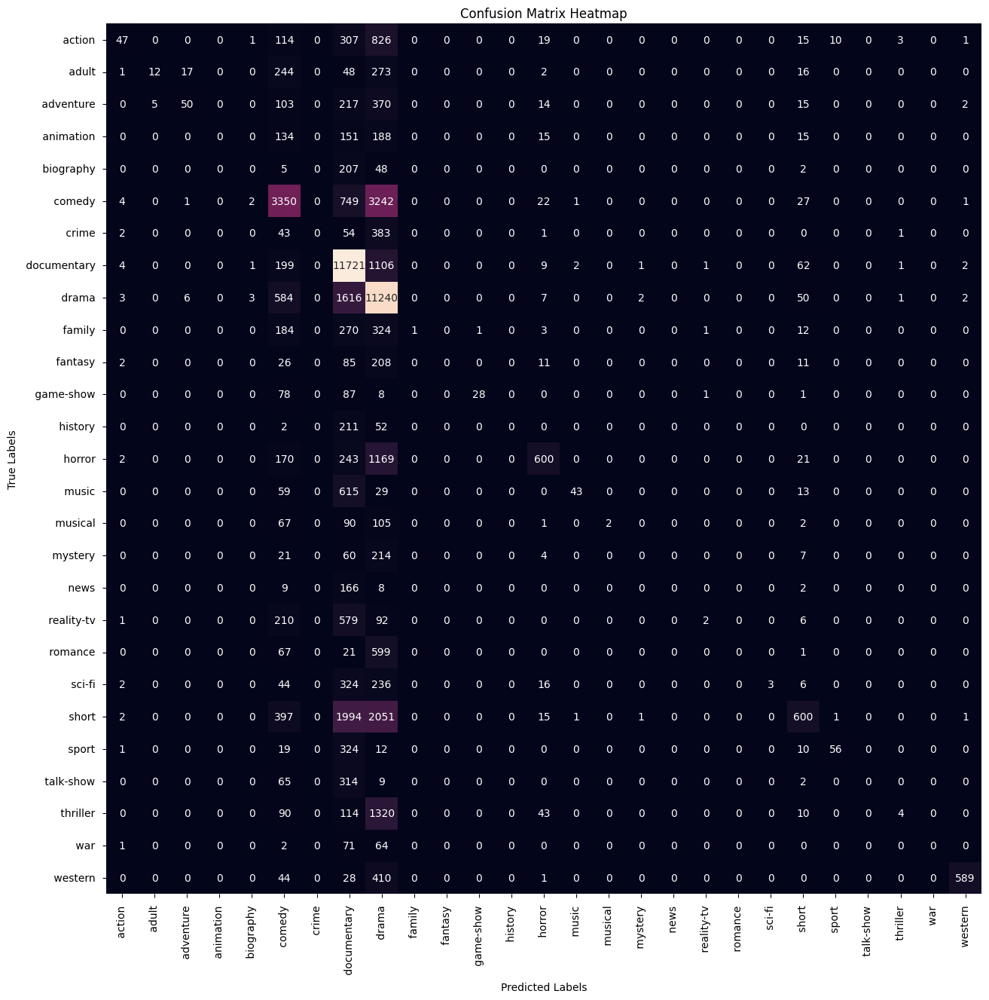

In [ ]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()


#LogisticRegression

Model Score on Training data 0.9967716346597303
Model Score on Training data 0.5702215581013522
               precision    recall  f1-score   support

      action        0.30      0.42      0.35       972
       adult        0.39      0.64      0.49       374
   adventure        0.23      0.40      0.29       441
   animation        0.16      0.37      0.23       217
   biography        0.00      0.03      0.01        32
      comedy        0.59      0.53      0.56      8261
       crime        0.08      0.19      0.12       208
 documentary        0.78      0.71      0.74     14528
       drama        0.69      0.56      0.62     16489
      family        0.18      0.35      0.23       402
     fantasy        0.09      0.29      0.13       102
   game-show        0.61      0.87      0.71       142
     history        0.03      0.23      0.05        35
      horror        0.59      0.64      0.61      2033
       music        0.51      0.63      0.56       612
     musical        0.1

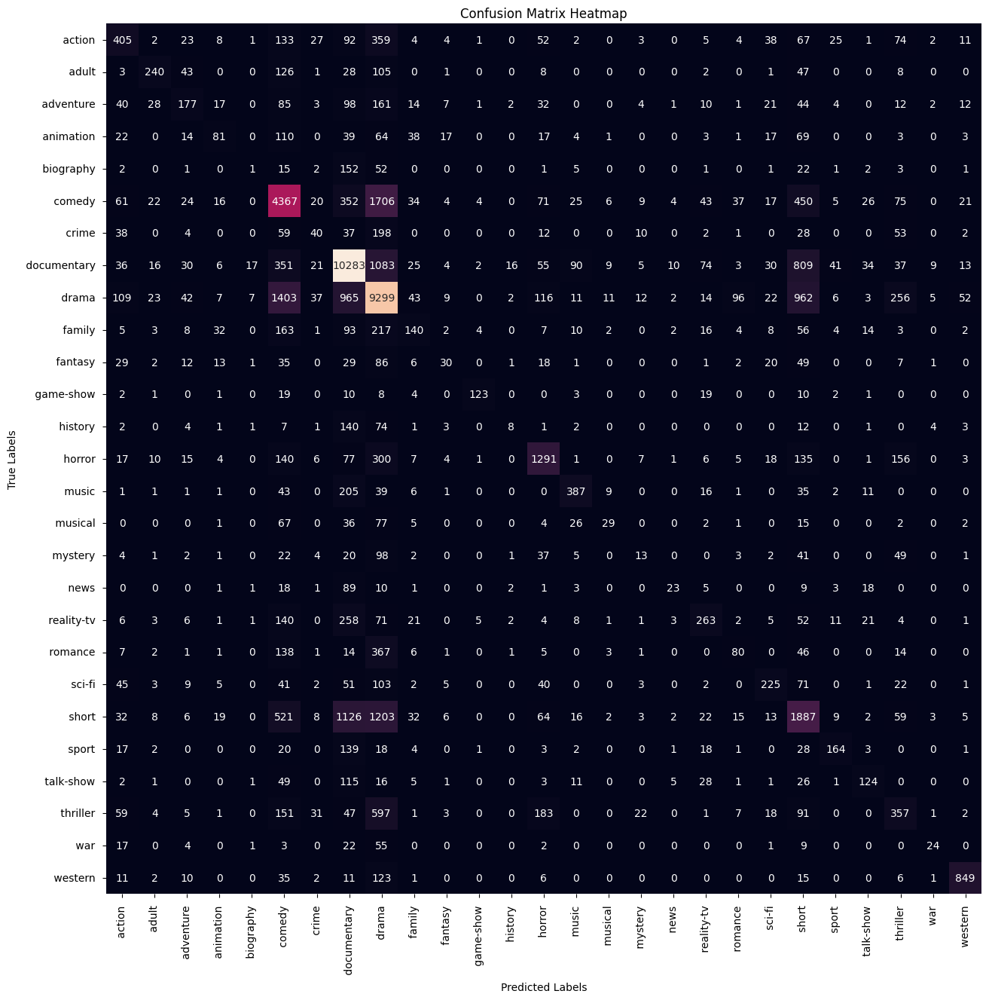

In [ ]:
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#LinearSupportVectorClassifier

Model Score on Training data 0.9996494917630564
Model Score on Training data 0.5184016824395373
               precision    recall  f1-score   support

      action        0.29      0.35      0.32      1097
       adult        0.39      0.51      0.45       470
   adventure        0.22      0.31      0.26       539
   animation        0.15      0.26      0.19       290
   biography        0.00      0.01      0.01       111
      comedy        0.52      0.49      0.51      7930
       crime        0.08      0.12      0.10       345
 documentary        0.73      0.69      0.71     13821
       drama        0.60      0.54      0.57     15104
      family        0.15      0.22      0.18       562
     fantasy        0.09      0.16      0.11       185
   game-show        0.60      0.73      0.66       166
     history        0.04      0.10      0.06       105
      horror        0.56      0.56      0.56      2193
       music        0.47      0.56      0.51       646
     musical        0.0

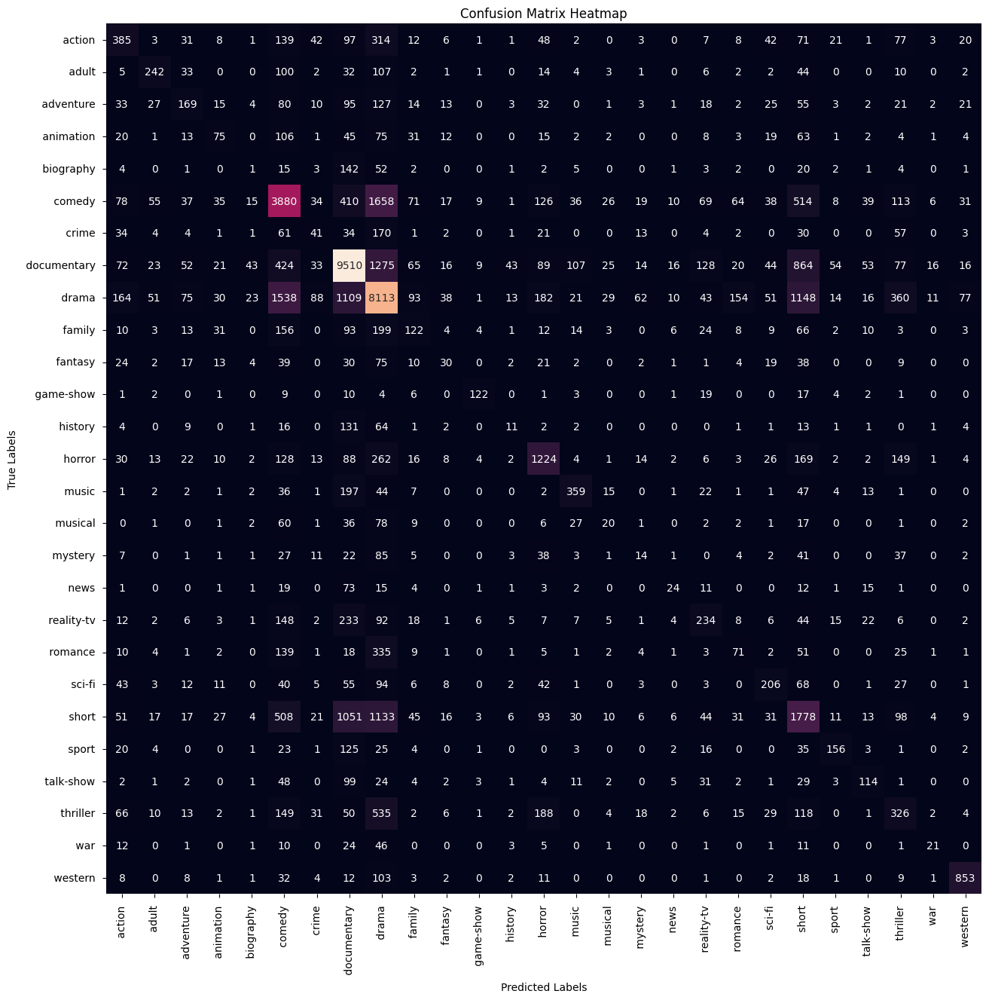

In [ ]:
svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#RandomForestClassifier

Random Forest - Train Score: 0.9996494917630564
Random Forest - Test Score: 0.4875200619846145
               precision    recall  f1-score   support

      action        0.01      0.63      0.02        19
       adult        0.04      0.75      0.08        36
   adventure        0.10      0.74      0.18       104
   animation        0.00      0.50      0.01         4
   biography        0.00      0.00      0.00         0
      comedy        0.27      0.54      0.36      3716
       crime        0.00      1.00      0.01         2
 documentary        0.88      0.56      0.69     20456
       drama        0.86      0.41      0.55     28333
      family        0.02      0.71      0.04        21
     fantasy        0.00      0.00      0.00         1
   game-show        0.41      0.85      0.55        98
     history        0.00      0.50      0.01         2
      horror        0.11      0.77      0.19       304
       music        0.09      0.92      0.17        75
     musical        0.01

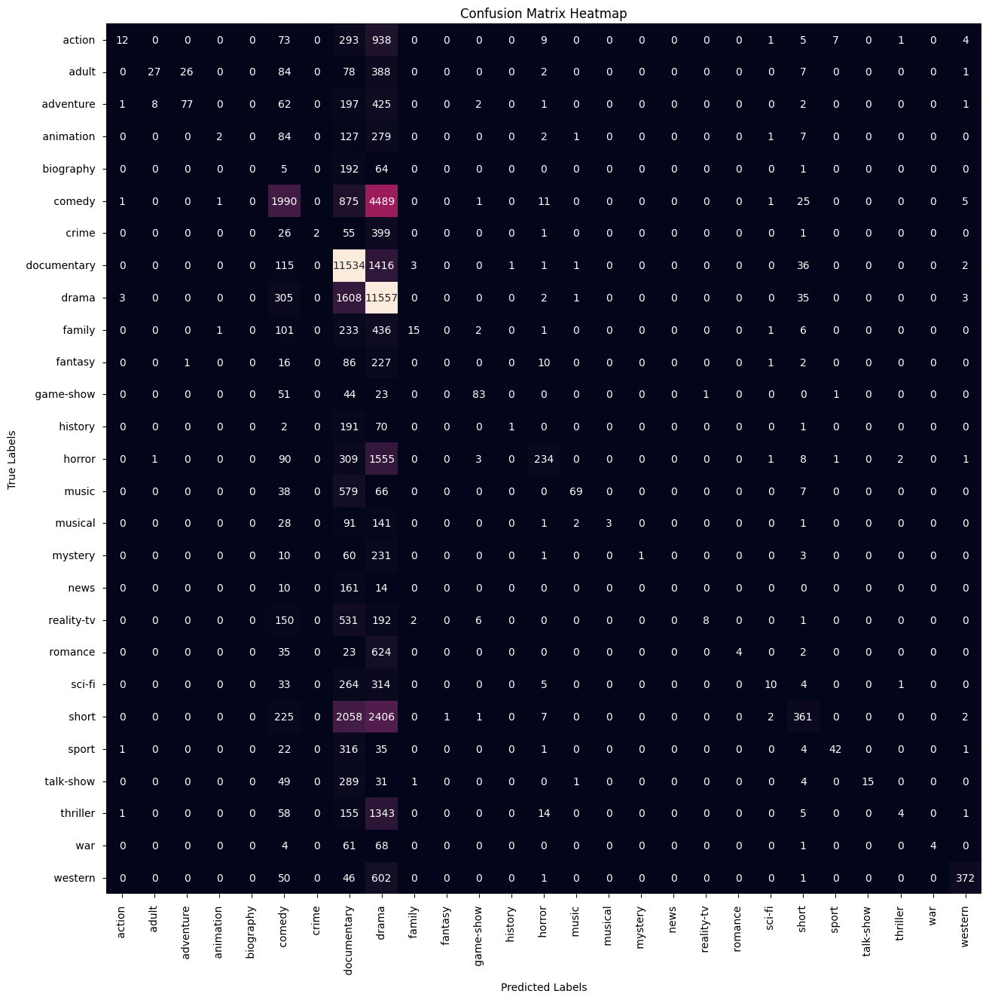

In [ ]:
random_forest = RandomForestClassifier()


random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [ ]:
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

#MultinomialNaiveBayes

Model Score on Training data 0.6398620104414559
Model Score on Training data 0.5229582895198037
               precision    recall  f1-score   support

      action        0.03      0.65      0.07        72
       adult        0.02      0.71      0.04        17
   adventure        0.06      0.68      0.12        74
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         7
      comedy        0.45      0.53      0.49      6330
       crime        0.00      0.00      0.00         0
 documentary        0.89      0.57      0.69     20666
       drama        0.83      0.46      0.59     24586
      family        0.00      1.00      0.00         1
     fantasy        0.00      0.00      0.00         0
   game-show        0.14      0.97      0.24        29
     history        0.00      0.00      0.00         0
      horror        0.27      0.77      0.40       783
       music        0.06      0.91      0.11        47
     musical        0.0

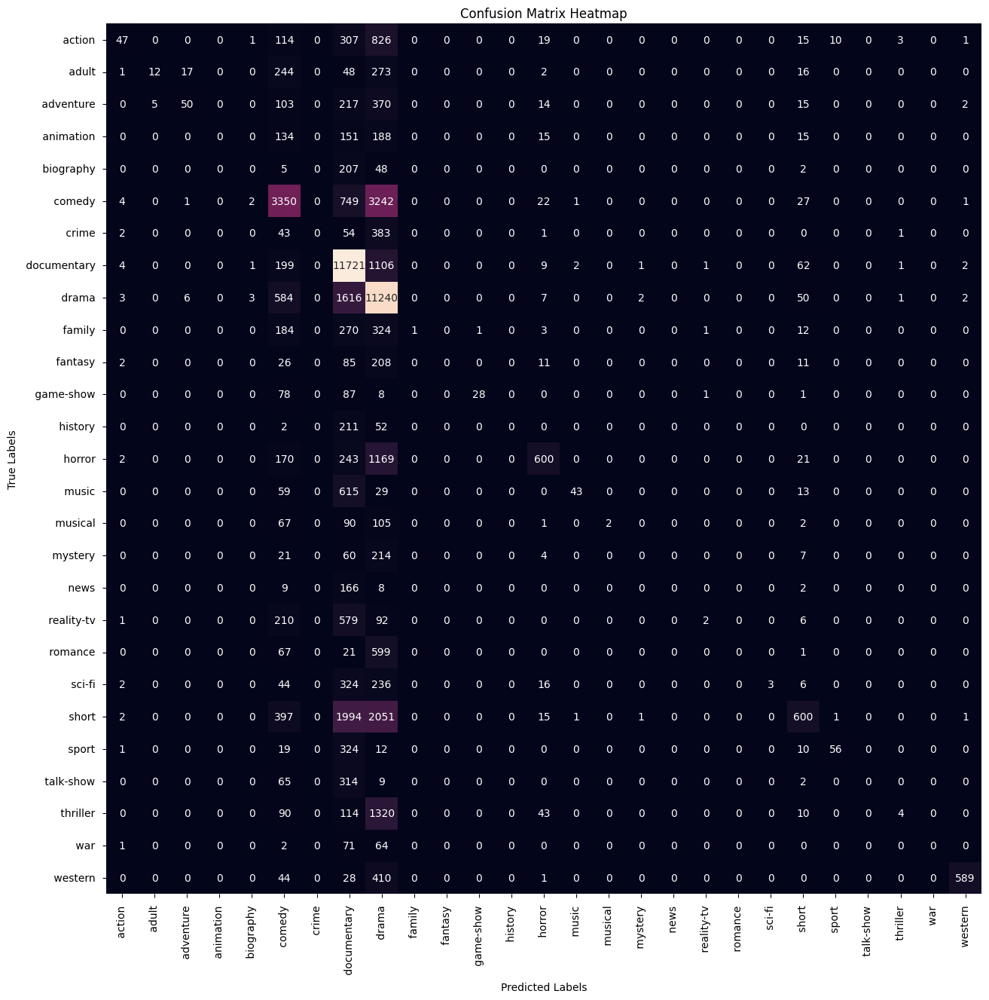

In [ ]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#LogisticRegression

Model Score on Training data 0.9967716346597303
Model Score on Training data 0.5702215581013522
               precision    recall  f1-score   support

      action        0.30      0.42      0.35       972
       adult        0.39      0.64      0.49       374
   adventure        0.23      0.40      0.29       441
   animation        0.16      0.37      0.23       217
   biography        0.00      0.03      0.01        32
      comedy        0.59      0.53      0.56      8261
       crime        0.08      0.19      0.12       208
 documentary        0.78      0.71      0.74     14528
       drama        0.69      0.56      0.62     16489
      family        0.18      0.35      0.23       402
     fantasy        0.09      0.29      0.13       102
   game-show        0.61      0.87      0.71       142
     history        0.03      0.23      0.05        35
      horror        0.59      0.64      0.61      2033
       music        0.51      0.63      0.56       612
     musical        0.1

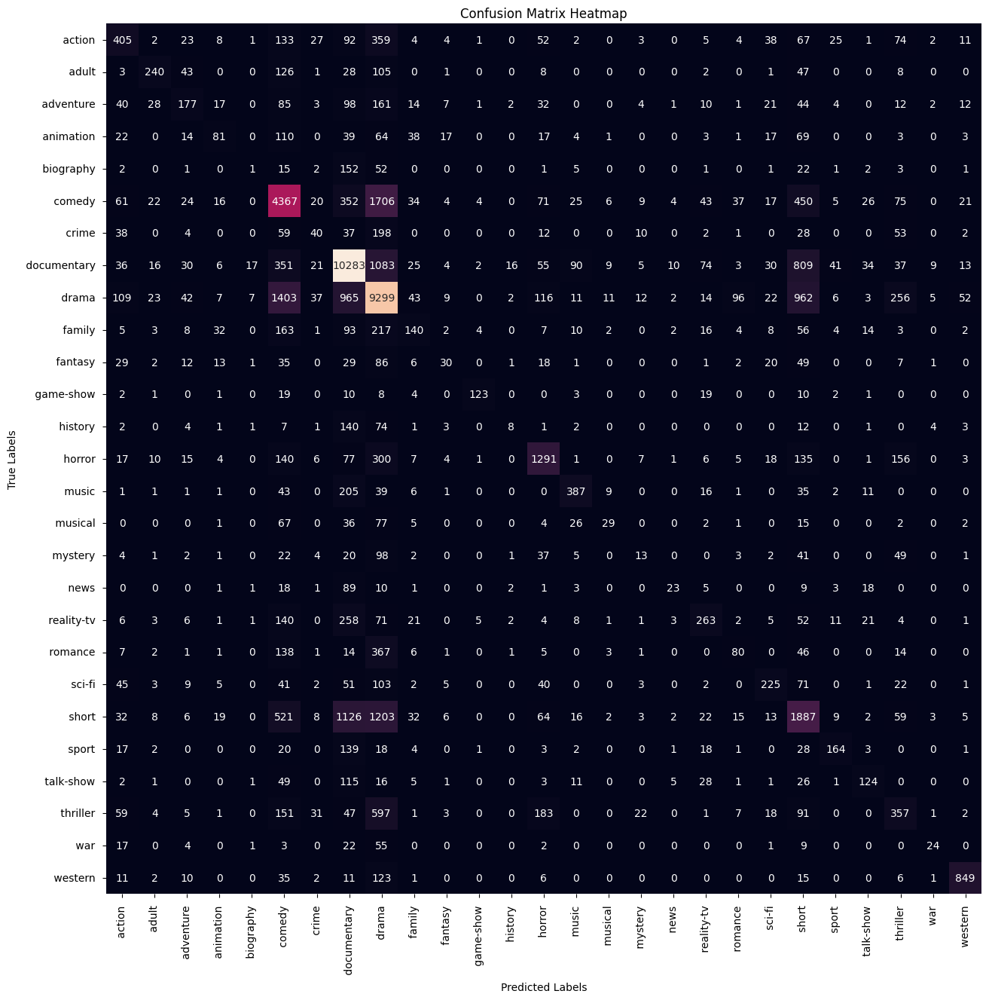

In [ ]:
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

#LinearSupportVectorClassifier

Model Score on Training data 0.9996494917630564
Model Score on Training data 0.5184201302414817
               precision    recall  f1-score   support

      action        0.29      0.35      0.32      1098
       adult        0.39      0.51      0.45       470
   adventure        0.22      0.31      0.26       539
   animation        0.15      0.26      0.19       290
   biography        0.00      0.01      0.01       110
      comedy        0.52      0.49      0.51      7926
       crime        0.08      0.12      0.10       345
 documentary        0.73      0.69      0.71     13820
       drama        0.60      0.54      0.57     15105
      family        0.15      0.22      0.18       561
     fantasy        0.09      0.16      0.11       185
   game-show        0.60      0.73      0.66       166
     history        0.04      0.10      0.06       105
      horror        0.56      0.56      0.56      2192
       music        0.47      0.56      0.51       647
     musical        0.0

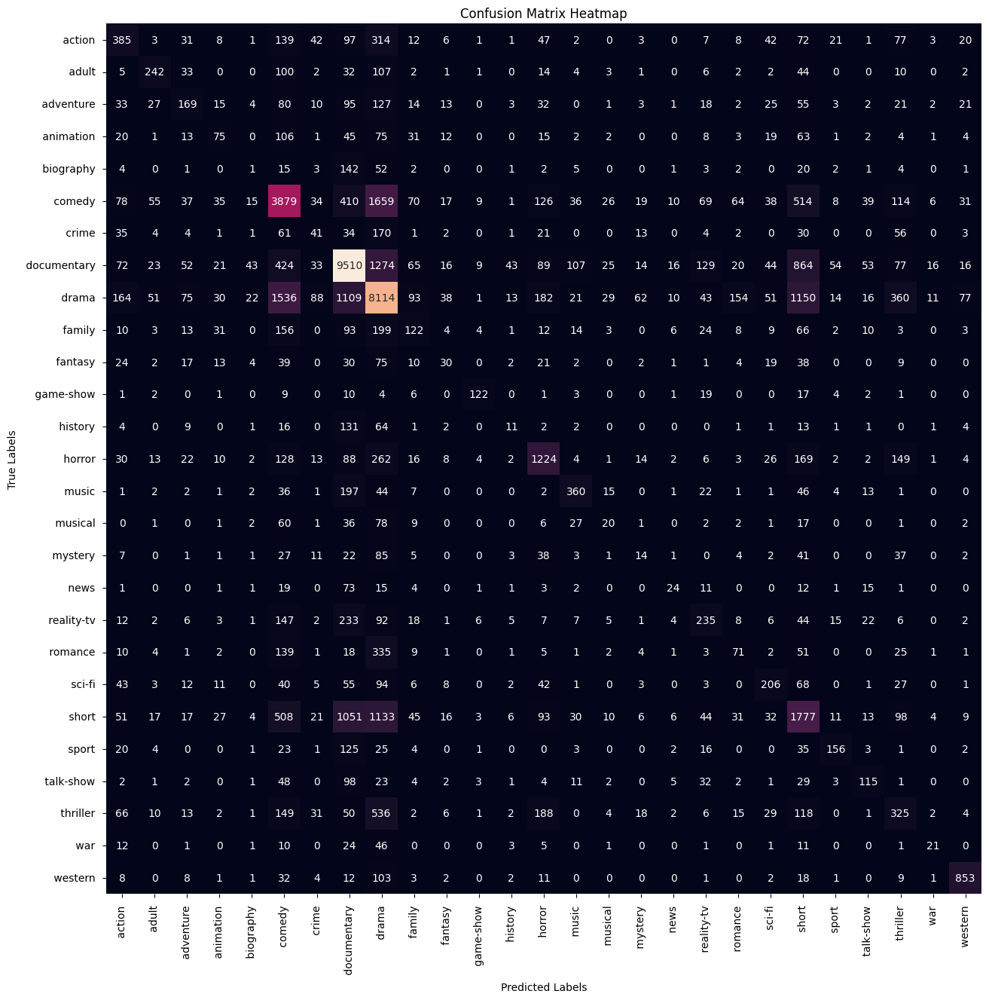

In [ ]:
svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)




cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()


# RandomForestClassifier

Random Forest - Train Score: 0.9996494917630564
Random Forest - Test Score: 0.48868227350711163
               precision    recall  f1-score   support

      action        0.01      0.59      0.02        27
       adult        0.04      0.81      0.07        27
   adventure        0.10      0.67      0.18       120
   animation        0.00      0.67      0.01         3
   biography        0.00      0.00      0.00         0
      comedy        0.27      0.55      0.37      3632
       crime        0.00      1.00      0.00         1
 documentary        0.88      0.56      0.69     20442
       drama        0.86      0.41      0.55     28351
      family        0.02      0.71      0.04        21
     fantasy        0.00      0.00      0.00         1
   game-show        0.45      0.88      0.59       104
     history        0.00      0.00      0.00         1
      horror        0.12      0.74      0.21       373
       music        0.10      0.90      0.18        87
     musical        0.0

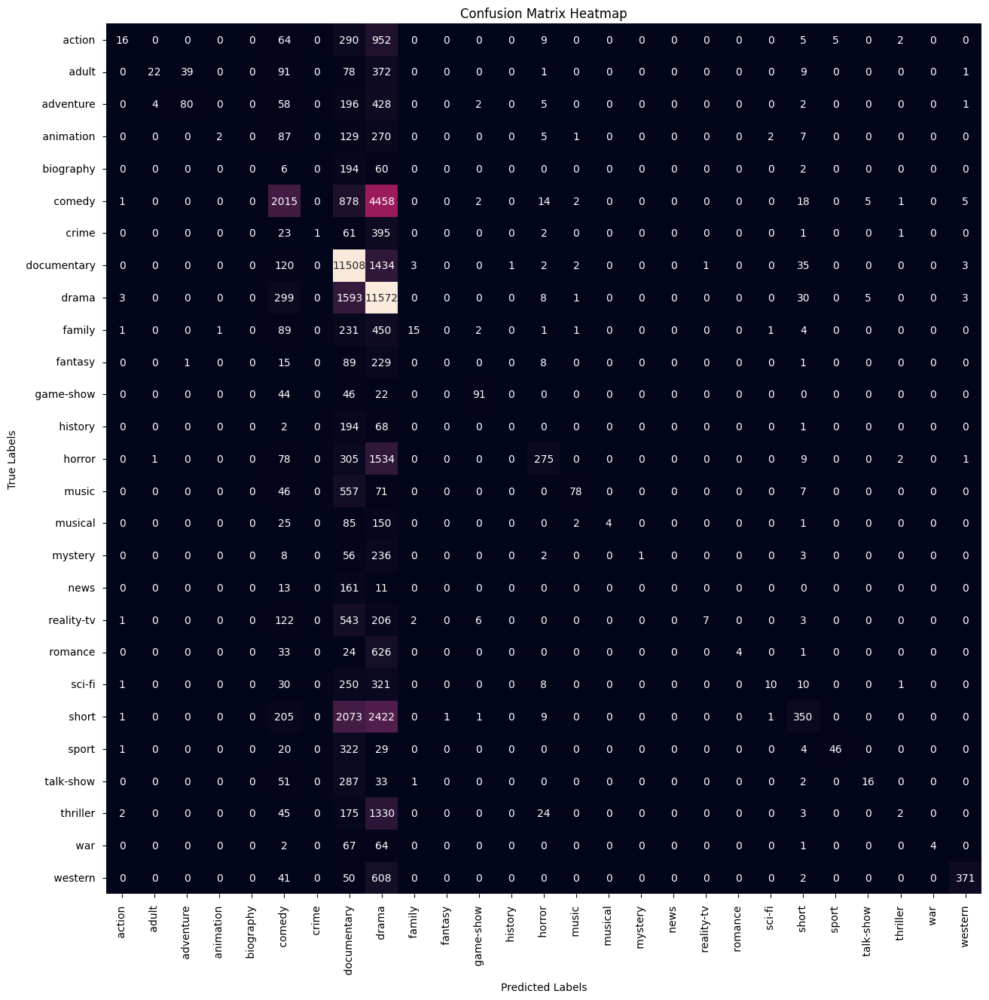

In [ ]:
random_forest = RandomForestClassifier()



random_forest.fit(x_train2, y_train)


print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))



cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()